In [114]:
%matplotlib inline
import string
import re
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly as py
import psycopg2
import textblob
import textatistic
import os
import math
import random
from nltk.corpus import stopwords
import seaborn as sbn
import requests
from wordcloud import *
from bs4 import BeautifulSoup
from collections import Counter
matplotlib.style.use('ggplot')
py.offline.init_notebook_mode()
import plotly.graph_objs as go
import psycopg2
import seaborn as sbn
import requests
import textatistic
import networkx as nx
from matplotlib import pyplot
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

In [100]:
opp = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__prior.csv')

KeyboardInterrupt: 

In [4]:
opt = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')

In [53]:
order = pd.read_csv('/home/faculty/millbr02/pub/ecomm/orders.csv')

In [6]:
products = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')

In [7]:
aisles = pd.read_csv('/home/faculty/millbr02/pub/ecomm/aisles.csv')

In [8]:
departments = pd.read_csv('/home/faculty/millbr02/pub/ecomm/departments.csv')

In [ ]:
opp.head()

In [ ]:
opt.head()

In [ ]:
aisles.head()

In [ ]:
departments.head()

In [ ]:
order.head()

In [ ]:
products.head()

In [12]:
order_product = opt.merge(products, how= 'inner',on = 'product_id')

In [13]:
order_product = order_product.merge(order, how= 'inner',on = 'order_id')

In [ ]:
order_product.head()

In [ ]:
a = order_product.groupby(['product_name'])['product_id'].count()

amount of food at checkout?

What is the most popular food item?

In [ ]:
a.sort_values(ascending = False)

In [ ]:
#fig, axes = plt.subplots(nrows=1 , ncols=1 , figsize(10,10))
#axes.violinplot(aco['add_to_cart_order'],showmeans=True,showmedians=False)

In [ ]:
pivot = pd.pivot_table(order_product[order_product.order_id<60],values='add_to_cart_order', index=['order_id'], columns=['product_id'])

In [ ]:
pivot

In [ ]:
pivot.iloc[1][pivot.iloc[1].notnull()]

In [ ]:
order_product.sort_values('order_id').head(20)

In [ ]:

aco = opt.groupby('order_id')['add_to_cart_order'].max()
aco = pd.DataFrame(aco)
aco.reset_index()


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,10))
axes.violinplot(aco['add_to_cart_order'], showmeans=True, showmedians=False)

In [ ]:
t = pd.pivot_table(opt[opt.order_id<100], index='order_id', columns = 'product_id', values='add_to_cart_order')

In [ ]:
t.iloc[0][t.iloc[1].notnull()]

In [ ]:
training = opt.sort_values('order_id')

In [ ]:
dic1 = {}
for i,row in training.iterrows():
    currentrow = row['order_id']
    if currentrow not in dic1:
        dic1[currentrow] = [row['product_id']]
    else:
        dic1[currentrow].append(row['product_id'])

In [ ]:
list1 = list(dic1.values())

In [ ]:
matrix1 = {}
for el in list1:
    for el1 in el:
        if el1 not in matrix1:
            count = 1
            matrix1[el1] = {k:count for k in el if k!=i}
        else:
            for i in el:
                if i != el1:
                    if i in matrix1[el1]:
                        matrix1[el1][i] += count
                    else:
                        matrix1[el1][i] = 1

In [2]:
matrix1

NameError: name 'matrix1' is not defined

In [ ]:
### What Miller Did, adjusted for my code

In [34]:
msk = np.random.rand(len(opt))<.8
train = opt[msk]
test = opt[~msk]

In [35]:
print(len(train))
print(len(test))

1107817
276800


In [36]:
aco = train.groupby('order_id')

In [37]:
aco.get_group(36['product_id'])

TypeError: 'int' object is not subscriptable

In [38]:
unique_orderids = aco.groups.keys()

In [39]:
%%time
iimat = {}
for oid in unique_orderids:
    for product1 in aco.get_group(oid)['product_id']:
        if int(product1) not in iimat:
            iimat[int(product1)] = {}
    for product2 in aco.get_group(oid)['product_id']:
        if product1 != product2:
            iimat[int(product1)][int(product2)] = iimat[int(product1)].get(int(product2),0) + 1
    

CPU times: user 1min 43s, sys: 584 ms, total: 1min 43s
Wall time: 1min 43s


In [40]:
%%time
msofar = 0
ones = 0
for key in iimat:
    for i in iimat[key]:
        if iimat[key][i] == 1:
            ones +=1
        if iimat[key][i] > msofar:
            msofar = iimat[key][i]
            print(key,i,msofar)

1 2433 1
1 40199 3
34 13176 5
130 13176 9
196 6184 11
196 19660 15
260 24852 28
4605 24852 40
4920 24852 67
16797 24852 79
21137 24852 106
21137 13176 131
CPU times: user 416 ms, sys: 0 ns, total: 416 ms
Wall time: 414 ms


In [41]:
delkeys = []
for i in iimat.keys():
    for k,v in iimat[i].items():
        if v == 1:
            delkeys.append((i,k))
len(delkeys)

775446

In [42]:
for i,j in delkeys:
    del iimat[i][j]

In [21]:
import json

In [22]:
with open('item_item.json','w') as f:
    json.dump(iimat,f)

In [9]:
iimat = pd.read_json('item_item.json')

In [ ]:
t = pd.DataFrame(iimat).to_sparse()

In [43]:
def getval(d):
    return d[1]
recs = sorted(iimat[13176].items(),key=getval,reverse = True)

In [44]:
for rec in recs[:10]:
    print(order_product[order_product.product_id == rec[0]].product_name)

44        Organic Strawberries
195       Organic Strawberries
316       Organic Strawberries
353       Organic Strawberries
394       Organic Strawberries
447       Organic Strawberries
585       Organic Strawberries
626       Organic Strawberries
641       Organic Strawberries
690       Organic Strawberries
903       Organic Strawberries
976       Organic Strawberries
1245      Organic Strawberries
1276      Organic Strawberries
1334      Organic Strawberries
1355      Organic Strawberries
1426      Organic Strawberries
1791      Organic Strawberries
1869      Organic Strawberries
1927      Organic Strawberries
2078      Organic Strawberries
2095      Organic Strawberries
2513      Organic Strawberries
2522      Organic Strawberries
2613      Organic Strawberries
2753      Organic Strawberries
2782      Organic Strawberries
2968      Organic Strawberries
3026      Organic Strawberries
3109      Organic Strawberries
                  ...         
867806    Organic Strawberries
867814  

In [45]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs = sorted(recs, key = getval, reverse=True)
    recs = [recs[x][0] for x in range(min(5,len(recs)))]
    recs = list(set(recs))
    return recs

In [46]:
for p in predictor(iimat, 13176,21137):
    print(order_product[order_product.product_id  == p].product_name)

5         Bag of Organic Bananas
35        Bag of Organic Bananas
66        Bag of Organic Bananas
80        Bag of Organic Bananas
329       Bag of Organic Bananas
349       Bag of Organic Bananas
389       Bag of Organic Bananas
418       Bag of Organic Bananas
471       Bag of Organic Bananas
555       Bag of Organic Bananas
711       Bag of Organic Bananas
842       Bag of Organic Bananas
850       Bag of Organic Bananas
896       Bag of Organic Bananas
942       Bag of Organic Bananas
1003      Bag of Organic Bananas
1037      Bag of Organic Bananas
1152      Bag of Organic Bananas
1273      Bag of Organic Bananas
1304      Bag of Organic Bananas
1327      Bag of Organic Bananas
1420      Bag of Organic Bananas
1482      Bag of Organic Bananas
1499      Bag of Organic Bananas
1584      Bag of Organic Bananas
1674      Bag of Organic Bananas
1736      Bag of Organic Bananas
1761      Bag of Organic Bananas
1816      Bag of Organic Bananas
1838      Bag of Organic Bananas
          

In [ ]:
products[products.products_name.str.find('Oreo')>=0]

##Testing
-iterate over each order in test set

    -use first tow items added to the oder to make predicion
    
    -compare the recommended items with the items in the rest of the order
    
    -If we have any in common then we get a point
    
-Our score at the end is the number of points/the number of orders

In [47]:
tco = train.groupby('order_id')

In [48]:
hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(iimat, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
print(hits, count, hits/count)

19254 110897 0.17362056683228583


## Aisles flow

In [101]:
merge1 = products.merge(opt).sort_values(by='order_id').reset_index(drop=True)

In [102]:
merge2 = merge1.set_index(["order_id"]).reset_index()

In [103]:
grouped = merge2.groupby('order_id')

In [104]:
grouped.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [105]:
%%time
aisles_to_aisles = {}
for i in list(set(merge2.order_id)):
    
    # get group by object for each order_id then sort by order added to cart
    grouped2 = grouped.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)
    
    aisles_list = list(grouped2.aisle_id)
    
    #create the aisle to aisle matrix
    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in aisles_to_aisles:
            aisles_to_aisles[item[0]] = {item[1]:1}
        else:
            if item[1] not in aisles_to_aisles[item[0]]:
                aisles_to_aisles[item[0]][item[1]] = 1
            else:
                aisles_to_aisles[item[0]][item[1]] += 1

CPU times: user 2min 17s, sys: 436 ms, total: 2min 18s
Wall time: 2min 17s


In [106]:
nonans = pd.DataFrame(aisles_to_aisles).fillna(0)

In [107]:
nonans.head()

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,0.0,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,0.0,1.0,0.0
2,12.0,134.0,23.0,21.0,6.0,2.0,9.0,3.0,44.0,2.0,...,2.0,0.0,2.0,28.0,24.0,8.0,55.0,1.0,2.0,2.0
3,23.0,19.0,4483.0,85.0,13.0,17.0,8.0,13.0,75.0,0.0,...,44.0,11.0,11.0,41.0,67.0,76.0,59.0,1.0,5.0,0.0
4,18.0,28.0,78.0,1164.0,41.0,11.0,17.0,10.0,116.0,3.0,...,10.0,7.0,13.0,52.0,110.0,45.0,132.0,1.0,9.0,1.0
5,6.0,12.0,21.0,42.0,91.0,5.0,6.0,2.0,41.0,2.0,...,0.0,0.0,2.0,24.0,31.0,10.0,25.0,0.0,2.0,0.0


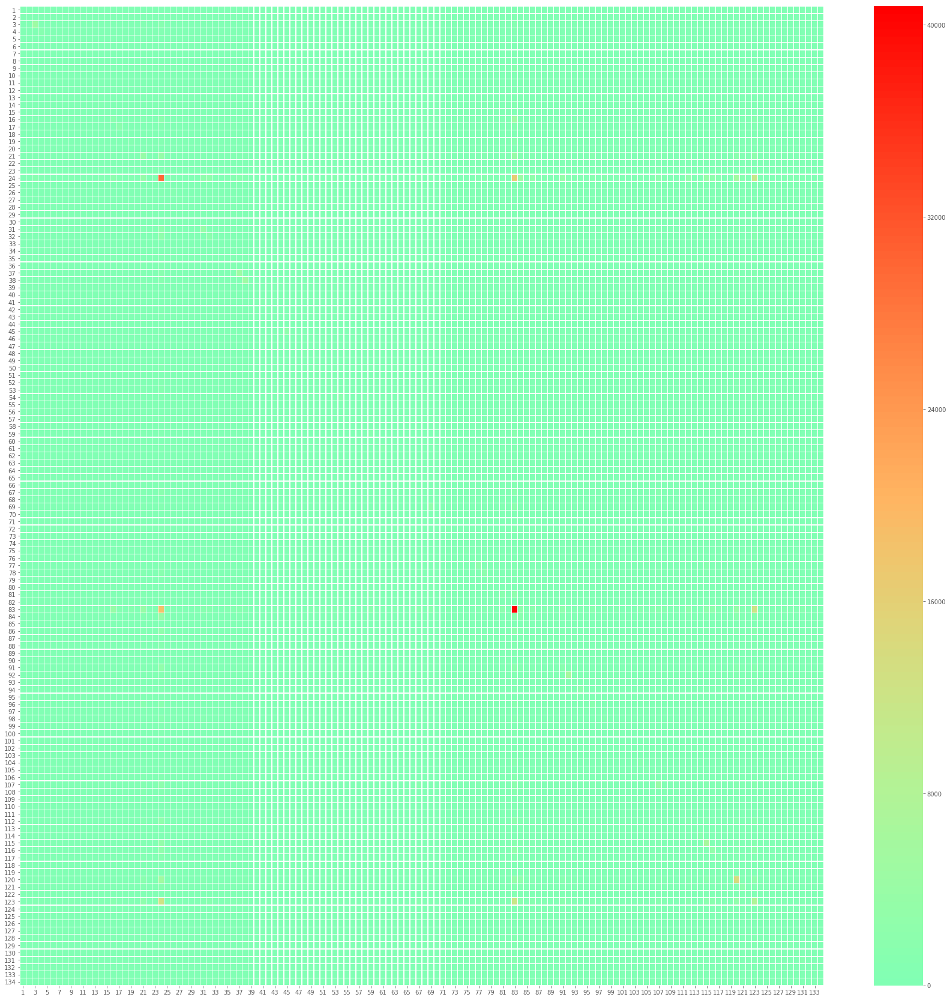

In [112]:
size = (30, 30)
fig, ax = pyplot.subplots(figsize=size)
ax = sbn.heatmap(nonans, vmin=0,center=0, linewidths=.2,cmap="rainbow")

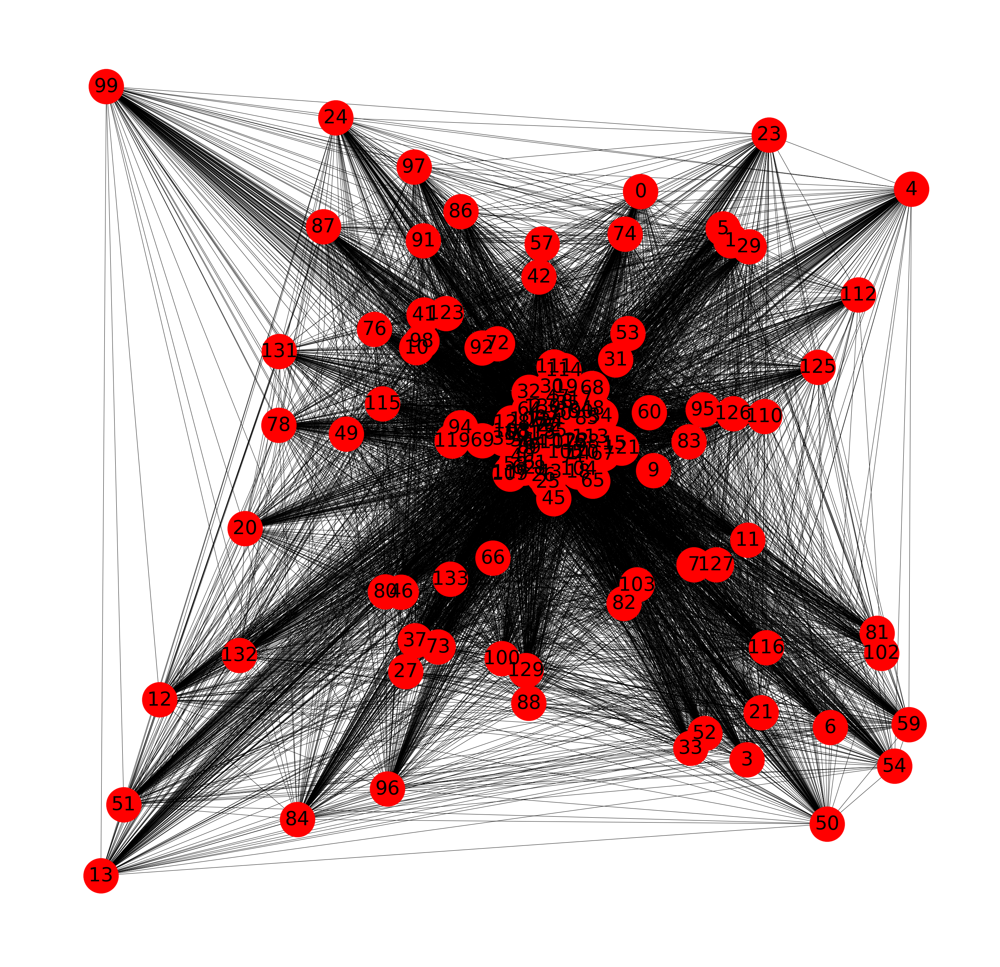

In [115]:
import numpy
A=numpy.matrix(nonans)
G=nx.from_numpy_matrix(A)
G.edges(data=True)
Gfig, gax = plt.subplots(figsize = (50,50))
nx.draw(G,nx.spring_layout(G, iterations=5), ax=gax, with_labels=True, node_size=10000, font_size = 55)